In [1]:
%%time
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from gurobipy import Model, GRB, quicksum
# this will try to fix the random number when seeded

# Для 20 вершин объем грузовика 500, для 50 вершин объем грузовика 750, для 50 вершин объем грузовика 1000
TW_CAPACITIES = {
    20: 30.,
    50: 40.,
    100: 50.,
    500: 70.
}
rnd = np.random
rnd.seed(0)

lst_all = []
lst_time = []
n_customer = 20
max_vehicle = 30
n_samples = 100
k = 0
min_capasity = 1
max_capasity = 42
capacity = np.minimum(np.maximum(np.abs(np.random.normal(15, 10, size=[n_samples, n_customer])), min_capasity), max_capasity)

#------------------------------#
# Определяем сколько грузовиков нам понадобится и в зависимости от этого увеличиваем максимальный объем вместимости
n = 2
max_vehicle *= n
while(max_vehicle < max_capasity):
    max_vehicle = max_vehicle / n
    n += 1
    max_vehicle *= n
print("Используется грузовиков: ", n)
#------------------------------#

for t in range(31, 51):
    lst = []
    lst_time.append(t)
    while(k < n_samples):
        cities = rnd.uniform(size=(n_customer, 2))
        #print('cities:', cities)
        xc = np.zeros(n_customer)
        yc = np.zeros(n_customer)

        for i in range(0, len(cities)):
            xc[i] = cities[i][0]
            yc[i] = cities[i][1]

        # parameters for the capacitated vehicle routing problem
        n = n_customer # кол-во вершин
        N = [i for i in range(1, n)] # tour без депо
        V = [0] + N # tour с депо
        A = [(i,j) for i in V for j in V if i != j] # possible arcs

        c = {(i,j): np.hypot(xc[i]-xc[j], yc[i]-yc[j]) for (i,j) in A} # расстояния между соседними городами

        Q = max_vehicle

        q = {i: capacity[k][i] for i in N} # number of VRUs at location i to be picked
        time_limit = t / 2
#-----------------------------------------------------------------------------------------------------------------#        
        model = Model('CVRP')

        # Declaration of variables
        x = model.addVars(A, vtype= GRB.BINARY)
        y = model.addVars(N, vtype= GRB.CONTINUOUS)
        # setting the objective function
        model.modelSense = GRB.MINIMIZE
        model.setObjective(quicksum(x[i, j]*c[i, j] for i, j in A))
        
        # Adding constraints
        model.addConstrs(quicksum(x[i,j] for j in V if j!=i) == 1 for i in N)
        model.addConstrs(quicksum(x[i,j] for i in V if i!=j) == 1 for j in N)
        model.addConstrs((x[i,j] == 1) >> (y[i] + q[j] == y[j]) for (i,j) in A if i != 0 and j != 0)
        model.addConstrs(y[i] >= q[i] for i in N)
        model.addConstrs(y[k] <= Q for k in N)
        
        # Optimizing the model
#         model.Params.MIPGap = 0.1
        model.Params.TimeLimit = time_limit  # seconds
        model.optimize()
        if model.status == GRB.OPTIMAL:
            print('1.Optimal objective: %g' % model.objVal)
            lst.append(model.objVal)
        elif model.status == GRB.INF_OR_UNBD:
            print('2.Model is infeasible or unbounded')
            res = -1
        elif model.status == GRB.INFEASIBLE:
            print('3.Model is infeasible')
            res = -1
        elif model.status == GRB.UNBOUNDED:
            print('4.Model is unbounded')
            res = -1
        else:
            print('5.Optimization ended with status %d' % model.status)
            lst.append(model.objVal)
        k += 1
    k = 0
    lst_all.append(lst)
#-----------------------------------------------------------------------------------------------------------------#  

#         if(res == -1):
#             plt.figure()
#             plt.plot(xc[0], yc[0], c='r', marker='s')
#             plt.scatter(xc[1:], yc[1:], c='b')
#         else:
#             active_arcs = [a for a in A if x[a].x > 0.99]
#             plt.figure()
#             for i, j in active_arcs:
#                 plt.plot([xc[i], xc[j]], [yc[i], yc[j]], c='g', zorder=0)
#                 plt.plot(xc[0], yc[0], c='r', marker='s')
#                 plt.scatter(xc[1:], yc[1:], c='b')

Используется грузовиков:  2
Academic license - for non-commercial use only - expires 2021-12-11
Using license file C:\Users\German\gurobi.lic
Changed value of parameter TimeLimit to 15.5
   Prev: inf  Min: 0.0  Max: inf  Default: inf
Gurobi Optimizer version 9.1.2 build v9.1.2rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 76 rows, 399 columns and 760 nonzeros
Model fingerprint: 0x70808135
Model has 342 general constraints
Variable types: 19 continuous, 380 integer (380 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [3e-02, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 6e+01]
Presolve added 634 rows and 77 columns
Presolve time: 0.06s
Presolved: 710 rows, 476 columns, 4732 nonzeros
Variable types: 112 continuous, 364 integer (364 binary)
Found heuristic solution: objective 16.3329946

Root relaxation: objective 2.938133e+00, 200 iterations, 0.01 seconds

    Nodes  

In [2]:
print(lst_all)
print(lst_time)

[[7.362355837281306, 7.543106895182823, 6.099017343005357, 5.512738873463488, 12.138532096044635, 9.858226105092772, 8.682424658183347, 7.943705696643566, 6.921019789058319, 6.9703543907082794, 7.572778405483062, 7.580973188902737, 5.546663460775422, 10.318716937770146, 8.783422348502441, 8.818327552949867, 7.701069464651006, 7.733961794851484, 7.3701649971951415, 6.760988131579779, 7.9761646374193855, 7.939278218270626, 6.341350262052009, 7.4628245354722855, 7.40177669409659, 8.720265979497938, 6.699535888999474, 6.584324043614231, 6.412293963203427, 6.570088892051954, 6.777215867502527, 8.699839893865676, 6.3204364768856305, 8.341346486897544, 7.942259396807065, 8.570941628714618, 7.030580394188213, 9.438477471897102, 6.893404070677187, 5.227316423730693, 6.771021733948622, 6.677213328311875, 7.220747104962861, 6.43840868853696, 6.3317762650667015, 6.754757448696027, 8.235681424281157, 7.803352717427721, 10.096062171195236, 7.5853594736733925, 6.782819021693987, 8.0341752000885, 6.25

In [12]:
from numpy  import array
lst_all = array(lst_all, dtype=np.float32)
with open("Arrays.txt", "a") as f:
    f.write(str(lst_all))


20
2000


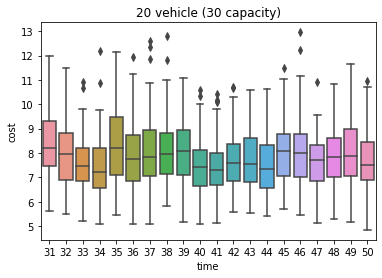

In [6]:
import pandas as pd
import seaborn as sns
print(len(lst_time))
print(len(sum(lst_all, [])))
n = len(lst_time) * 5
df = pd.DataFrame({'time': lst_time * n, 'cost':sum(lst_all, [])})
# print(df)

ax = sns.boxplot(x = 'time',y = 'cost',data = df)
plt.title("20 vehicle (30 capacity)")
plt.savefig('20_vehicle_30_capacity.png')